In [1]:
import pandas as pd

import numpy as np
import matplotlib.pyplot as plt
import skfuzzy as fuzz
from skfuzzy import control as ctrl
import warnings

import seaborn as sns
from scipy.stats import ranksums
import plotly.express as px
import requests

import warnings
warnings.filterwarnings("ignore")

# Baixar e tranformar bases

In [2]:
microdados = pd.read_csv('microdados_ed_basica_2021.csv',sep= ';', encoding="ISO-8859-1")
col = ['CO_ENTIDADE','CO_UF','SG_UF','NO_REGIAO','CO_MUNICIPIO','NO_MUNICIPIO','TP_LOCALIZACAO',
       'QT_MAT_BAS','IN_INTERNET', 'IN_INTERNET_APRENDIZAGEM','IN_FUND_AI','IN_FUND_AF',
       'IN_MED','IN_QUADRA_ESPORTES','IN_BIBLIOTECA_SALA_LEITURA','IN_SALA_ATELIE_ARTES']
microdados = microdados[col]
def RuralUrbano(row):
    val = "-"
    if row['TP_LOCALIZACAO'] == 1:
        val = 'Urbana'
    elif row['TP_LOCALIZACAO'] == 2:
        val = 'Rural'
    return val

microdados['LOCALIZACAO'] = microdados.apply(RuralUrbano, axis=1)

# Escolas sem internet

In [3]:
#Velocidades
m_e = pd.read_csv('microdados-escolas.csv')

In [4]:
#Remover dirvegencias
SemNet = microdados.query('IN_INTERNET == 0')
busca = m_e.query('TCP_DOWN_MBPS>0.2')
busca = busca[['CO_ENTIDADE']]
busca = pd.merge(busca, SemNet, how = 'inner', on = 'CO_ENTIDADE')
busca = SemNet.append(busca)
SemNet = busca.drop_duplicates(subset=['CO_ENTIDADE'],keep=False)

In [5]:
SemNet_Rural = SemNet.query('TP_LOCALIZACAO == 2')

# Baixa Internet

In [6]:
BaixaNet_Rural = microdados.query('IN_INTERNET == 1 and IN_INTERNET_APRENDIZAGEM == 0 and TP_LOCALIZACAO == 2')

In [7]:
BaixaNet_Rural['NIVEL_INTERNET'] = 1
SemNet_Rural['NIVEL_INTERNET'] = 0

In [8]:
SemNet_final = SemNet_Rural.append(BaixaNet_Rural)

# Analisa notas

In [9]:
notas = pd.read_csv("Notas.csv",sep=";")
notas.rename(columns = {'ID_ESCOLA':'CO_ENTIDADE'}, inplace = True)
notas = pd.merge(microdados, notas, how = 'inner', on = 'CO_ENTIDADE')

In [10]:
notas['NOTA_MEDIA'] = notas[['NOTA_INICIAL', 'NOTA_FINAL', 'NOTA_MEDIO']].mean(axis=1)

In [11]:
AsMedias={'Escolas':[], 'Status':[], 'Media_Fund_I':[],'Media_Fund_II':[],'Media_E_Medio':[],'Media':[]}
AsMedias=pd.DataFrame(AsMedias)

In [12]:
#Analise
sel = 'Urbana'

b1 = notas[notas['LOCALIZACAO'] == sel].query('IN_INTERNET_APRENDIZAGEM == 1')
b2 = notas[notas['LOCALIZACAO'] == sel].query('IN_INTERNET_APRENDIZAGEM == 0')

v1 = b1['NOTA_INICIAL'].mean()
v2 = b1['NOTA_FINAL'].mean()
v3 = b1['NOTA_MEDIO'].mean()
v4 = b1['NOTA_MEDIA'].mean()


AsMedias = AsMedias.append({'Escolas':sel, 'Status':'com internet', 'Media_Fund_I':v1, 
                            'Media_Fund_II':v2, 'Media_E_Medio':v3, 'Media':v4}, ignore_index=True)

v1 = b2['NOTA_INICIAL'].mean()
v2 = b2['NOTA_FINAL'].mean()
v3 = b2['NOTA_MEDIO'].mean()
v4 = b2['NOTA_MEDIA'].mean()


AsMedias = AsMedias.append({'Escolas':sel,'Status':'sem internet', 'Media_Fund_I':v1,
                            'Media_Fund_II':v2, 'Media_E_Medio':v3, 'Media':v4}, ignore_index=True)

AsMedias

,Escolas,Status,Media_Fund_I,Media_Fund_II,Media_E_Medio,Media
0,Urbana,com internet,5.966372,5.284728,4.673288,5.552292
1,Urbana,sem internet,5.503885,4.949603,4.376761,5.258293


In [13]:
sel = 'Rural'

b1 = notas[notas['LOCALIZACAO'] == sel].query('IN_INTERNET_APRENDIZAGEM == 1')
b2 = notas[notas['LOCALIZACAO'] == sel].query('IN_INTERNET_APRENDIZAGEM == 0')

v1 = b1['NOTA_INICIAL'].mean()
v2 = b1['NOTA_FINAL'].mean()
v3 = b1['NOTA_MEDIO'].mean()
v4 = b1['NOTA_MEDIA'].mean()


AsMedias = AsMedias.append({'Escolas':sel, 'Status':'com internet', 'Media_Fund_I':v1,
                            'Media_Fund_II':v2, 'Media_E_Medio':v3, 'Media':v4}, ignore_index=True)

v1 = b2['NOTA_INICIAL'].mean()
v2 = b2['NOTA_FINAL'].mean()
v3 = b2['NOTA_MEDIO'].mean()
v4 = b2['NOTA_MEDIA'].mean()


AsMedias = AsMedias.append({'Escolas':sel,'Status':'sem internet', 'Media_Fund_I':v1,
                            'Media_Fund_II':v2, 'Media_E_Medio':v3, 'Media':v4}, ignore_index=True)

AsMedias

,Escolas,Status,Media_Fund_I,Media_Fund_II,Media_E_Medio,Media
0,Urbana,com internet,5.966372,5.284728,4.673288,5.552292
1,Urbana,sem internet,5.503885,4.949603,4.376761,5.258293
2,Rural,com internet,5.414368,4.898295,4.401919,5.144228
3,Rural,sem internet,4.867302,4.414327,3.909713,4.652506


<AxesSubplot:xlabel='Escolas', ylabel='Media_E_Medio'>

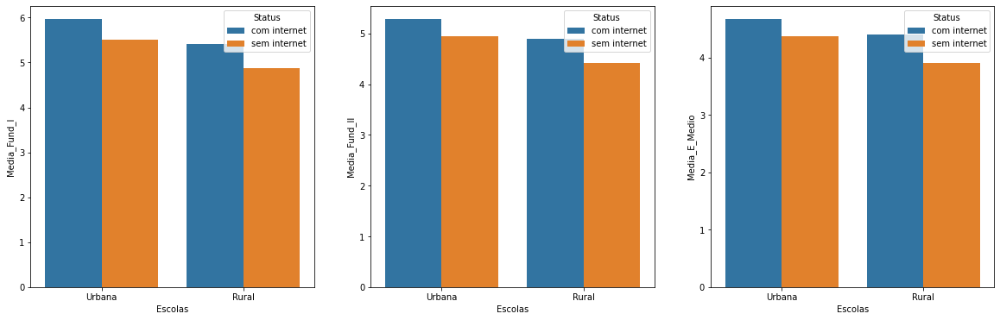

In [14]:
plt.figure(figsize = (20,6))
plt.subplot(1,3,1)
sns.barplot('Escolas', 'Media_Fund_I', hue = 'Status', data = AsMedias)

plt.subplot(1,3,2)
sns.barplot('Escolas', 'Media_Fund_II', hue = 'Status', data = AsMedias)

plt.subplot(1,3,3)
sns.barplot('Escolas', 'Media_E_Medio', hue = 'Status', data = AsMedias)

<AxesSubplot:xlabel='LOCALIZACAO', ylabel='NOTA_MEDIA'>

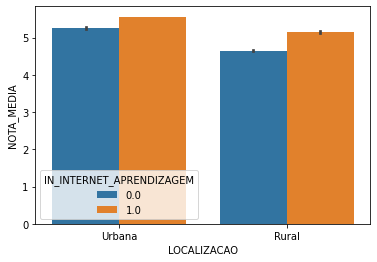

In [15]:
plt.figure(figsize = (6,4))
sns.barplot('LOCALIZACAO', 'NOTA_MEDIA', hue= 'IN_INTERNET_APRENDIZAGEM', data= notas)

### Teste de hipótese


**H<sup>null</sup>**

> **O uso da internet no processo de aprendizagem não influencia a média das notas nas escolas**

**H<sup>alt</sup>**

> **O uso da internet no processo de aprendizagem influencia a média das notas nas escolas**

In [16]:
fund_I_com_internet = notas.query("IN_INTERNET_APRENDIZAGEM == 1")['NOTA_INICIAL']
fund_I_sem_internet = notas.query("IN_INTERNET_APRENDIZAGEM == 0")['NOTA_INICIAL']
ranksums(fund_I_com_internet, fund_I_sem_internet)

RanksumsResult(statistic=51.55818591690043, pvalue=0.0)

In [17]:
fund_II_com_internet = notas.query("IN_INTERNET_APRENDIZAGEM == 1")['NOTA_FINAL']
fund_II_sem_internet = notas.query("IN_INTERNET_APRENDIZAGEM == 0")['NOTA_FINAL']
ranksums(fund_II_com_internet, fund_II_sem_internet)

RanksumsResult(statistic=61.016386749133616, pvalue=0.0)

In [18]:
ensino_medio_com_internet = notas.query("IN_INTERNET_APRENDIZAGEM == 1")['NOTA_MEDIO']
ensino_medio_sem_internet = notas.query("IN_INTERNET_APRENDIZAGEM == 0")['NOTA_MEDIO']
ranksums(ensino_medio_com_internet, ensino_medio_sem_internet)

RanksumsResult(statistic=78.51220515713872, pvalue=0.0)

**H<sup>alt</sup>**

> **O uso da internet no processo de aprendizagem influencia a média das notas nas escolas**

# Contagem 19 - 21

In [19]:
PDDE = pd.read_csv('PDDE_2020.csv',sep=";")

In [20]:
micro2019 = pd.read_csv('microdados_ed_basica_2019.csv', sep=";", encoding="ISO-8859-1")
micro2019 = micro2019[col]

In [21]:
f21 = microdados.query("IN_INTERNET_APRENDIZAGEM == 1 and TP_LOCALIZACAO == 2")
f21 = f21['SG_UF'].value_counts()
f19 = micro2019.query("IN_INTERNET_APRENDIZAGEM == 1 and TP_LOCALIZACAO == 2")
f19 = f19['SG_UF'].value_counts()
fComp  = pd.DataFrame({'2021': f21, '2019': f19})

fComp['DIFI'] = fComp['2021'] - fComp['2019']

PDDE_busca = PDDE[['ESTADO','N_ESCOLAS','VALOR_POR_ESCOLA']]
PDDE_busca = PDDE_busca.set_index('ESTADO')

fComp['PDDE'] = PDDE_busca['N_ESCOLAS']
fComp['VALOR_POR_ESCOLA'] = PDDE_busca['VALOR_POR_ESCOLA']

In [22]:
fComp[['2019','2021','DIFI','PDDE','VALOR_POR_ESCOLA']]

,2019,2021,DIFI,PDDE,VALOR_POR_ESCOLA
AC,21,50,29,432,"3029,03"
AL,192,348,156,1730,"3008,67"
AM,216,295,79,1438,"3177,95"
AP,24,38,14,125,"3258,41"
BA,1032,1845,813,8019,"2843,95"
CE,814,1091,277,4801,"2969,27"
DF,29,37,8,240,"3476,1"
ES,291,339,48,1644,"3052,36"
GO,233,269,36,1268,"3118,89"
MA,344,707,363,4981,"2832,07"


# Comparativo gastos

In [23]:
cont_alunos = pd.DataFrame(SemNet_final.groupby('SG_UF')['QT_MAT_BAS'].sum())
cont_alunos.reset_index(inplace=True)
cont_escolas = pd.DataFrame(SemNet_final.groupby('SG_UF')['CO_ENTIDADE'].count())
cont_escolas.reset_index(inplace=True)
tabela = pd.merge(cont_escolas, cont_alunos, on = 'SG_UF')
tabela.rename(columns={'CO_ENTIDADE': 'N_ESCOLAS'}, inplace = True)

tabela['Media_Marticulas_Escolas'] = tabela['QT_MAT_BAS']/tabela['N_ESCOLAS']
tabela['Media_Marticulas_Escolas'] = tabela['Media_Marticulas_Escolas'].astype(int)
tabela['Custo_Equipamento'] = tabela['N_ESCOLAS']*2670
tabela['Custo_Ano'] = tabela['N_ESCOLAS']*230*12
tabela['Mat_Custo'] = tabela['Custo_Ano']/tabela['QT_MAT_BAS']
tabela['Custo_Ano_Um'] = tabela['Custo_Equipamento']+tabela['Custo_Ano']
pdde_vlor = PDDE[['ESTADO','VALOR_REPASSADO']]
pdde_vlor.rename(columns = {'ESTADO': 'SG_UF'}, inplace = True)
tabela = pd.merge(tabela, pdde_vlor, on = 'SG_UF')

tabela['Rank_Gasto'] = 1/(tabela['Custo_Ano']/tabela['VALOR_REPASSADO'])+1/(tabela['Custo_Ano_Um']/tabela['VALOR_REPASSADO'])
 
tabela_final = tabela

# classificação com logica fuzzy

In [24]:
QT_MAT_BAS = ctrl.Antecedent(np.arange(9999, 515219 + 1, 1), 'QT_MAT_BAS')
Mat_Custo = ctrl.Antecedent(np.arange(12.469880, 56.524057 + 1, 1), 'Mat_Custo')
Rank_Gasto = ctrl.Antecedent(np.arange(0.405551, 32.055485 + 1, 1), 'Rank_Gasto')
propensao = ctrl.Consequent(np.arange(0, 11, 0.5), 'propensao')

In [25]:
QT_MAT_BAS['baixa'] = fuzz.trimf(QT_MAT_BAS.universe, [0, 0, 59186])
QT_MAT_BAS['media'] = fuzz.trimf(QT_MAT_BAS.universe, [28605, 59186, 121350])
QT_MAT_BAS['alta'] = fuzz.trapmf(QT_MAT_BAS.universe, [59186, 121350, 515519, 515519])

Mat_Custo['baixa'] = fuzz.trapmf(Mat_Custo.universe, [0, 0, 28, 34])
Mat_Custo['media'] = fuzz.trimf(Mat_Custo.universe, [28, 34, 41])
Mat_Custo['alta'] = fuzz.trapmf(Mat_Custo.universe, [34, 41, 58, 58])

Rank_Gasto['baixa'] = fuzz.trimf(Rank_Gasto.universe, [0, 0, 2.8])
Rank_Gasto['media'] = fuzz.trimf(Rank_Gasto.universe, [2.8, 6.7, 8.6])
Rank_Gasto['alta'] = fuzz.trapmf(Rank_Gasto.universe, [6.7, 8.6, 32, 32] )

propensao['baixa'] = fuzz.trapmf(propensao.universe, [0, 0, 2.5, 5])
propensao['media'] = fuzz.trimf(propensao.universe, [2.5, 5, 7.5])
propensao['alta'] = fuzz.trapmf(propensao.universe, [5, 7.5, 11, 11])

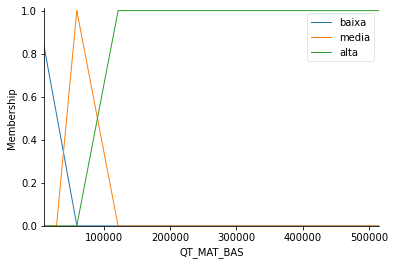

In [26]:
QT_MAT_BAS.view()

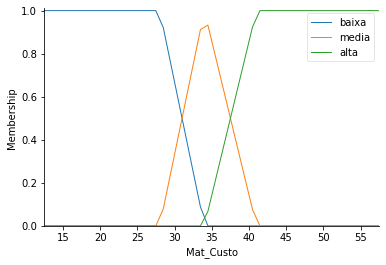

In [27]:
Mat_Custo.view()

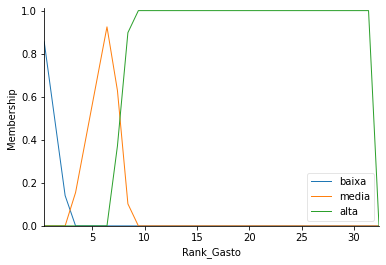

In [28]:
Rank_Gasto.view()

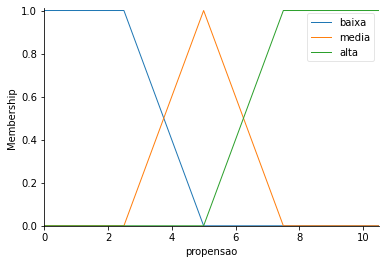

In [29]:
propensao.view()

In [30]:
# regras 

regra10 = ctrl.Rule(QT_MAT_BAS['alta'] & Mat_Custo['baixa'] & Rank_Gasto['alta'], propensao['alta'])
regra20 = ctrl.Rule(QT_MAT_BAS['media'] & Mat_Custo['baixa'] & Rank_Gasto['alta'], propensao['alta'])
regra30 = ctrl.Rule(QT_MAT_BAS['baixa'] & Mat_Custo['baixa'] & Rank_Gasto['alta'], propensao['media'])
regra40 = ctrl.Rule(QT_MAT_BAS['alta'] & Mat_Custo['media'] & Rank_Gasto['alta'], propensao['alta'])
regra50 = ctrl.Rule(QT_MAT_BAS['media'] & Mat_Custo['media'] & Rank_Gasto['alta'], propensao['alta'])
regra60 = ctrl.Rule(QT_MAT_BAS['baixa'] & Mat_Custo['media'] & Rank_Gasto['alta'], propensao['media'])
regra70 = ctrl.Rule(QT_MAT_BAS['alta'] & Mat_Custo['alta'] & Rank_Gasto['alta'], propensao['media'])
regra80 = ctrl.Rule(QT_MAT_BAS['media'] & Mat_Custo['alta'] & Rank_Gasto['alta'], propensao['media'])
regra90 = ctrl.Rule(QT_MAT_BAS['baixa'] & Mat_Custo['alta'] & Rank_Gasto['alta'], propensao['baixa'])

regra11 = ctrl.Rule(QT_MAT_BAS['alta'] & Mat_Custo['baixa'] & Rank_Gasto['media'], propensao['alta'])
regra21 = ctrl.Rule(QT_MAT_BAS['media'] & Mat_Custo['baixa'] & Rank_Gasto['media'], propensao['alta'])
regra31 = ctrl.Rule(QT_MAT_BAS['baixa'] & Mat_Custo['baixa'] & Rank_Gasto['media'], propensao['media'])
regra41 = ctrl.Rule(QT_MAT_BAS['alta'] & Mat_Custo['media'] & Rank_Gasto['media'], propensao['media'])
regra51 = ctrl.Rule(QT_MAT_BAS['media'] & Mat_Custo['media'] & Rank_Gasto['media'], propensao['media'])
regra61 = ctrl.Rule(QT_MAT_BAS['baixa'] & Mat_Custo['media'] & Rank_Gasto['media'], propensao['baixa'])
regra71 = ctrl.Rule(QT_MAT_BAS['alta'] & Mat_Custo['alta'] & Rank_Gasto['media'], propensao['baixa'])
regra81 = ctrl.Rule(QT_MAT_BAS['media'] & Mat_Custo['alta'] & Rank_Gasto['media'], propensao['baixa'])
regra91 = ctrl.Rule(QT_MAT_BAS['baixa'] & Mat_Custo['alta'] & Rank_Gasto['media'], propensao['baixa'])

regra12 = ctrl.Rule(QT_MAT_BAS['alta'] & Mat_Custo['baixa'] & Rank_Gasto['baixa'], propensao['media'])
regra22 = ctrl.Rule(QT_MAT_BAS['media'] & Mat_Custo['baixa'] & Rank_Gasto['baixa'], propensao['media'])
regra32 = ctrl.Rule(QT_MAT_BAS['baixa'] & Mat_Custo['baixa'] & Rank_Gasto['baixa'], propensao['baixa'])
regra42 = ctrl.Rule(QT_MAT_BAS['alta'] & Mat_Custo['media'] & Rank_Gasto['baixa'], propensao['baixa'])
regra52 = ctrl.Rule(QT_MAT_BAS['media'] & Mat_Custo['media'] & Rank_Gasto['baixa'], propensao['baixa'])
regra62 = ctrl.Rule(QT_MAT_BAS['baixa'] & Mat_Custo['media'] & Rank_Gasto['baixa'], propensao['baixa'])
regra72 = ctrl.Rule(QT_MAT_BAS['alta'] & Mat_Custo['alta'] & Rank_Gasto['baixa'], propensao['baixa'])
regra82 = ctrl.Rule(QT_MAT_BAS['media'] & Mat_Custo['alta'] & Rank_Gasto['baixa'], propensao['baixa'])
regra92 = ctrl.Rule(QT_MAT_BAS['baixa'] & Mat_Custo['alta'] & Rank_Gasto['baixa'], propensao['baixa'])

ListaDeRegras = ctrl.ControlSystem([regra10, regra20, regra30, regra40,regra50, regra60, regra70, regra80, regra90,
                                           regra11, regra21, regra31, regra41,regra51, regra61, regra71, regra81, regra91,
                                           regra12, regra22, regra32, regra42,regra52, regra62, regra72, regra82, regra92])

In [31]:
recomendacao = ctrl.ControlSystemSimulation(ListaDeRegras)

In [32]:
def L_fuzzy(row):
    recomendacao.input['QT_MAT_BAS'] = row['QT_MAT_BAS']
    recomendacao.input['Mat_Custo'] = row['Mat_Custo']
    recomendacao.input['Rank_Gasto'] = row['Rank_Gasto']
    recomendacao.compute()
    return recomendacao.output['propensao']

tabela_final['Nota_Fuzzy'] = tabela_final.apply(L_fuzzy, axis=1)

In [33]:
tabela_final = tabela_final.sort_values(by = ['Nota_Fuzzy'], ascending= False)

In [34]:
recomendacao.input['QT_MAT_BAS'] = 9599.0
recomendacao.input['Mat_Custo'] = 12.651318
recomendacao.input['Rank_Gasto'] = 10.361576
recomendacao.compute()

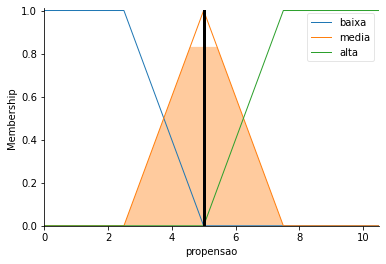

In [35]:
# DF
propensao.view(sim = recomendacao)

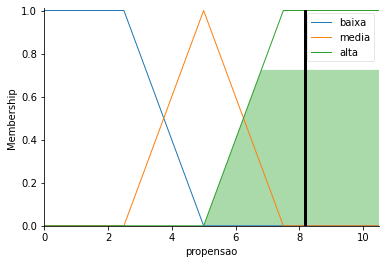

In [36]:
# CE
propensao.view(sim = recomendacao)

In [40]:
tabela_final[['SG_UF','N_ESCOLAS','QT_MAT_BAS','Mat_Custo','Rank_Gasto','Nota_Fuzzy']]

,SG_UF,N_ESCOLAS,QT_MAT_BAS,Mat_Custo,Rank_Gasto,Nota_Fuzzy
5,CE,1385,176530.0,21.654110,5.624787,8.172956
18,RJ,703,94849.0,20.456515,11.698996,8.090638
1,AL,833,119301.0,19.271255,3.414685,7.847287
24,SE,532,59186.0,24.808570,3.264531,7.558664
19,RN,786,66545.0,32.599895,3.511823,6.612958
12,MT,348,36697.0,26.173257,6.790512,6.395941
22,RS,615,46549.0,36.464801,11.061139,6.360109
6,DF,44,9599.0,12.651318,10.361576,5.000000
11,MS,99,21912.0,12.469880,6.820142,5.000000
15,PE,2169,193648.0,30.914030,2.760393,4.761811


In [ ]:
tabela_final.to_csv

### Mapa escolas rurais


In [125]:
conexao_escola = pd.read_csv('Conectividade_Escolas.csv', sep=';', decimal='.')

In [126]:
# Renomeando as colunas 

conexao_escola = conexao_escola.rename(columns={'Censo Escolar - Localização': 'Localização'})
conexao_escola = conexao_escola.rename(columns={'Latitude': 'latitude'})
conexao_escola = conexao_escola.rename(columns={'Longitude': 'longitude'})
conexao_escola = conexao_escola.rename(columns={'Censo Escolar - Matrículas Educação Básica': 'Matrículas'})

# Excluindo linhas "Urbana"
indexNames = conexao_escola[ conexao_escola['Localização'] == 'Urbana' ].index
# Delete these row indexes from dataFrame
conexao_escola.drop(indexNames , inplace=True)

,Data Publicação,Código INEP,Ano Censo,Município,Código Município,UF,Nome Escola,Matrículas,Matrículas Período Matutino,Matrículas Período Vespertino,...,Medidor - Velocidade média de download (mbps),Medidor - Velocidade média de upload (mbps),Nordeste Conectado - Status Instalação,Anatel - Cobertura 4G,MegaEdu - Presença de Infra Fixa,Censo Escolas - Situação Funcionamento,Censo Escolar - Dependência,Localização,Censo Escolar - Rede Local,Censo Escolar - Localização Diferenciada
1,06/2022,12033316,2021,Feijó,1200302,AC,ESC INDIGENA BOM FUTURO,23.0,23.0,0.0,...,NaN,NaN,NaN,Não,Sem energia ou apenas gerador,Em Atividade,Estadual,Rural,Não informado,Terra indígena
2,06/2022,13096249,2021,Beruri,1300631,AM,ESCOLA MUNICIPAL INDIGENA SAO FRANCISCO DA COL...,11.0,11.0,0.0,...,NaN,NaN,NaN,Sim,Sem energia ou apenas gerador,Em Atividade,Municipal,Rural,Não informado,Terra indígena
3,06/2022,12033774,2021,Feijó,1200302,AC,ESC INDIGENA BEJAMIM KAMPA,16.0,16.0,0.0,...,NaN,NaN,NaN,Não,Sem energia ou apenas gerador,Em Atividade,Estadual,Rural,Não informado,Terra indígena
4,06/2022,12032751,2021,Feijó,1200302,AC,ESC INDIGENA KESHUANI SHANENAWA,41.0,20.0,21.0,...,NaN,NaN,NaN,Sim,Sem energia ou apenas gerador,Em Atividade,Estadual,Rural,Não informado,Terra indígena
5,06/2022,13096222,2021,Beruri,1300631,AM,ESCOLA MUNICIPAL INDIGENA OI TCHURUNE,9.0,9.0,0.0,...,NaN,NaN,NaN,Não,Sem energia ou apenas gerador,Em Atividade,Municipal,Rural,Não informado,Terra indígena
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277611,09/2022,29457416,2021,Tanhaçu,2931004,BA,ESCOLA MUNICIPAL ZUMBI DOS PALMARES,49.0,49.0,0.0,...,"9,82","1,87",NaN,Sim,Fora de cobertura - fibra viável,Em Atividade,Municipal,Rural,A cabo,Área onde se localiza comunidade remanescente ...
277612,06/2022,21058768,2021,Itapecuru Mirim,2105401,MA,UEB STO ANTONIO,78.0,46.0,32.0,...,NaN,NaN,NaN,Não,Cabo Metálico na Região,Em Atividade,Municipal,Rural,Não informado,Área onde se localiza comunidade remanescente ...
277613,06/2022,21058369,2021,Itapecuru Mirim,2105401,MA,UEB STO ANTONIO,67.0,0.0,67.0,...,NaN,NaN,NaN,Sim,Cabo Metálico na Região,Em Atividade,Municipal,Rural,Não informado,Área onde se localiza comunidade remanescente ...
277614,06/2022,21058210,2021,Itapecuru Mirim,2105401,MA,UEB PROTECAO DE MARIA,102.0,67.0,35.0,...,NaN,NaN,NaN,Não,Fibra na Região,Em Atividade,Municipal,Rural,Não informado,Área onde se localiza comunidade remanescente ...


In [127]:
# mudando a latitude para float
conexao_escola['latitude'] = conexao_escola['latitude'].astype(str)
conexao_escola['latitude'] = conexao_escola['latitude'].str.replace(',', '.')

# mudando a longitude para float
conexao_escola['longitude'] = conexao_escola['longitude'].astype(str)
conexao_escola['longitude'] = conexao_escola['longitude'].str.replace(',', '.')

# Transformando string em float - só deu certo com errors = coerce
conexao_escola['latitude'] = pd.to_numeric(conexao_escola['latitude'], errors='coerce')
conexao_escola['longitude'] = pd.to_numeric(conexao_escola['longitude'], errors='coerce')

conexao_escola

,Data Publicação,Código INEP,Ano Censo,Município,Código Município,UF,Nome Escola,Matrículas,Matrículas Período Matutino,Matrículas Período Vespertino,...,Medidor - Velocidade média de download (mbps),Medidor - Velocidade média de upload (mbps),Nordeste Conectado - Status Instalação,Anatel - Cobertura 4G,MegaEdu - Presença de Infra Fixa,Censo Escolas - Situação Funcionamento,Censo Escolar - Dependência,Localização,Censo Escolar - Rede Local,Censo Escolar - Localização Diferenciada
1,06/2022,12033316,2021,Feijó,1200302,AC,ESC INDIGENA BOM FUTURO,23.0,23.0,0.0,...,NaN,NaN,NaN,Não,Sem energia ou apenas gerador,Em Atividade,Estadual,Rural,Não informado,Terra indígena
2,06/2022,13096249,2021,Beruri,1300631,AM,ESCOLA MUNICIPAL INDIGENA SAO FRANCISCO DA COL...,11.0,11.0,0.0,...,NaN,NaN,NaN,Sim,Sem energia ou apenas gerador,Em Atividade,Municipal,Rural,Não informado,Terra indígena
3,06/2022,12033774,2021,Feijó,1200302,AC,ESC INDIGENA BEJAMIM KAMPA,16.0,16.0,0.0,...,NaN,NaN,NaN,Não,Sem energia ou apenas gerador,Em Atividade,Estadual,Rural,Não informado,Terra indígena
4,06/2022,12032751,2021,Feijó,1200302,AC,ESC INDIGENA KESHUANI SHANENAWA,41.0,20.0,21.0,...,NaN,NaN,NaN,Sim,Sem energia ou apenas gerador,Em Atividade,Estadual,Rural,Não informado,Terra indígena
5,06/2022,13096222,2021,Beruri,1300631,AM,ESCOLA MUNICIPAL INDIGENA OI TCHURUNE,9.0,9.0,0.0,...,NaN,NaN,NaN,Não,Sem energia ou apenas gerador,Em Atividade,Municipal,Rural,Não informado,Terra indígena
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277611,09/2022,29457416,2021,Tanhaçu,2931004,BA,ESCOLA MUNICIPAL ZUMBI DOS PALMARES,49.0,49.0,0.0,...,"9,82","1,87",NaN,Sim,Fora de cobertura - fibra viável,Em Atividade,Municipal,Rural,A cabo,Área onde se localiza comunidade remanescente ...
277612,06/2022,21058768,2021,Itapecuru Mirim,2105401,MA,UEB STO ANTONIO,78.0,46.0,32.0,...,NaN,NaN,NaN,Não,Cabo Metálico na Região,Em Atividade,Municipal,Rural,Não informado,Área onde se localiza comunidade remanescente ...
277613,06/2022,21058369,2021,Itapecuru Mirim,2105401,MA,UEB STO ANTONIO,67.0,0.0,67.0,...,NaN,NaN,NaN,Sim,Cabo Metálico na Região,Em Atividade,Municipal,Rural,Não informado,Área onde se localiza comunidade remanescente ...
277614,06/2022,21058210,2021,Itapecuru Mirim,2105401,MA,UEB PROTECAO DE MARIA,102.0,67.0,35.0,...,NaN,NaN,NaN,Não,Fibra na Região,Em Atividade,Municipal,Rural,Não informado,Área onde se localiza comunidade remanescente ...


In [128]:
# Gerando o gráfico via px.density_mapbox

centro_mapa = {'lat': -12.530863, 'lon': -49.9219642}


mapa = px.density_mapbox(conexao_escola, lat='latitude', lon='longitude', z='Matrículas', radius =1.2,
                           center = centro_mapa, zoom = 3.3,
                           mapbox_style = 'open-street-map', width=900, height=700)
# Colocando nome no Gráfico


mapa.show()